In [ ]:
!pip install pydicom
!pip install dicom


     |████████████████████████████████| 7.0MB 6.3MB/s 
     |████████████████████████████████| 768kB 8.7MB/s 


In [ ]:
import pandas as pd
import tensorflow as tf
import numpy as np
import pydicom
import dicom
import os
import matplotlib.pyplot as plt
import cv2
import math
import random as rd
%matplotlib inline

/usr/local/lib/python3.6/dist-packages/dicom/__init__.py:53: UserWarning: 
This code is using an older version of pydicom, which is no longer 
maintained as of Jan 2017.  You can access the new pydicom features and API 
by installing `pydicom` from PyPI.
See 'Transitioning to pydicom 1.x' section at pydicom.readthedocs.org 
for more information.

  warnings.warn(msg)


In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive


In [ ]:
!ls /content/gdrive/"My Drive"/sample0001

In [ ]:
# Reduced Image pixel size and the depth to process data without cloud
IMG_PXL_SIZE = 50
HM_SLICES = 20

In [ ]:
# Data Path
data_labels = pd.read_csv('/content/gdrive/My Drive/stage1_labels.csv',index_col=0)
data_dir = '/content/gdrive/My Drive/sample0001/'
patients = os.listdir(data_dir)
#test_patients = pd.read_csv('D:/Documents/Major Project/Jupyter Notebooks/stage1_sample_submission.csv')

In [ ]:
d=data_labels
d=d.to_dict('id')
filelist=[]
namelist=[]
ff=[]
pdict=[]
for i in patients:
    xx=data_dir + i
    ds = pydicom.dcmread(xx)
    ds=str(ds.data_element('PatientName').value)
    pdict.append({i:ds})
    namelist.append(ds)
   


In [ ]:
print(d)

{'0015ceb851d7251b8f399e39779d1e7d': {'cancer': 1}, '0030a160d58723ff36d73f41b170ec21': {'cancer': 0}, '003f41c78e6acfa92430a057ac0b306e': {'cancer': 0}, '006b96310a37b36cccb2ab48d10b49a3': {'cancer': 1}, '008464bb8521d09a42985dd8add3d0d2': {'cancer': 1}, '0092c13f9e00a3717fdc940641f00015': {'cancer': 0}, '00986bebc45e12038ef0ce3e9962b51a': {'cancer': 0}, '00cba091fa4ad62cc3200a657aeb957e': {'cancer': 0}, '00edff4f51a893d80dae2d42a7f45ad1': {'cancer': 1}, '0121c2845f2b7df060945b072b2515d7': {'cancer': 0}, '013395589c01aa01f8df81d80fb0e2b8': {'cancer': 0}, '01de8323fa065a8963533c4a86f2f6c1': {'cancer': 0}, '01e349d34c06410e1da273add27be25c': {'cancer': 0}, '01f1140c8e951e2a921b61c9a7e782c2': {'cancer': 0}, '024efb7a1e67dc820eb61cbdaa090166': {'cancer': 0}, '0257df465d9e4150adef13303433ff1e': {'cancer': 1}, '0268f3a7a17412178cfb039e71799a80': {'cancer': 0}, '026be5d5e652b6a7488669d884ebe297': {'cancer': 0}, '02801e3bbcc6966cb115a962012c35df': {'cancer': 1}, '028996723faa7840bb57f57e28275

In [ ]:
# Function to break a list of slices into chunks of lists
def chunks(l, n):
    """Yield successive n-sized chunks from l."""
    for i in range(0, len(l), n):
        yield l[i:i + n]

In [ ]:
def mean(l):
    return sum(l)/len(l)

## Function to limit depth

This function will limit the depth of 3-D CT Scans to 20 slices. Because of variable number of slices, it can not be used with a neural network

In [ ]:
# Function to process data
def process_data(patient, data_labels, img_pxl_size=20, hm_slices=20, vizualize = False):
    for i in range(len(patients)):
        if patient==patients[i]:
          tt=namelist[i]
          #print(tt)
          label =int(d[tt]['cancer'])
          break
    
    
    path = data_dir
    slices = [dicom.read_file(path + '/' + s) for s in os.listdir(path)]
    slices.sort(key = lambda x: float(x.ImagePositionPatient[2]))
    #print(len(slices), label)
    #print(slices[0])
    plt.imshow(slices[0].pixel_array)
    plt.show()

    new_slices = []

    slices = [cv2.resize(np.array(each_slice.pixel_array),(IMG_PXL_SIZE,IMG_PXL_SIZE)) for each_slice in slices]

    chunk_sizes = math.ceil(len(slices) / HM_SLICES)



    for slice_chunk in chunks(slices,chunk_sizes):
        slice_chunk = list(map(mean, zip(*slice_chunk)))
        new_slices.append(slice_chunk)


    if len(new_slices) == HM_SLICES-1:
        new_slices.append(new_slices[-1])

    if len(new_slices) == HM_SLICES-2:
        new_slices.append(new_slices[-1])
        new_slices.append(new_slices[-1])

    if len(new_slices) == HM_SLICES+2:
        new_val = list(map(mean, zip(*[new_slices[HM_SLICES-1],new_slices[HM_SLICES]])))
        del new_slices[HM_SLICES]
        new_slices[HM_SLICES-1] = new_val

    if len(new_slices) == HM_SLICES+1:
        new_val = list(map(mean, zip(*[new_slices[HM_SLICES-1],new_slices[HM_SLICES]])))
        del new_slices[HM_SLICES]
        new_slices[HM_SLICES-1] = new_val


    if vizualize:
        fig = plt.figure()
        for num,each_slice in enumerate(slices[:12]):
            y = fig.add_subplot(4,5,num+1)
            #new_image = scipy.misc.imresize(np.array(each_slice.pixel_array),(IMG_PXL_SIZE,IMG_PXL_SIZE))
            #y.imshow(slices[0].pixel_array)
            #y.imshow(each_slice)

        plt.show()

    if label == 1: label = np.array([0,1])
    elif label == 0: label = np.array([1,0])

    return np.array(new_slices), label

In [ ]:
# Function to process data
def process(patient, data_labels,clas,ii, img_pxl_size=20, hm_slices=20, vizualize = False):
  
  pos_path= '/content/gdrive/My Drive/cancerous/positive/%d/'%(ii+1)
  neg_path='/content/gdrive/My Drive/cancerous/negative/%d/'%(ii+1)
  path = patient
  if clas=='positive':
    label=1
    slices = [dicom.read_file(path) for s in os.listdir(pos_path)]

  elif clas=='negative':
    label=0 
    slices = [dicom.read_file(path) for s in os.listdir(neg_path)]
  slices.sort(key = lambda x: float(x.ImagePositionPatient[2]))
  plt.imshow(slices[0].pixel_array)
  plt.show()
  new_slices = []
  slices = [cv2.resize(np.array(each_slice.pixel_array),(IMG_PXL_SIZE,IMG_PXL_SIZE)) for each_slice in slices]
  chunk_sizes = math.ceil(len(slices) / HM_SLICES)

  for slice_chunk in chunks(slices,chunk_sizes):
        slice_chunk = list(map(mean, zip(*slice_chunk)))
        new_slices.append(slice_chunk)

  if len(new_slices) == HM_SLICES-1:
        new_slices.append(new_slices[-1])

  if len(new_slices) == HM_SLICES-2:
        new_slices.append(new_slices[-1])
        new_slices.append(new_slices[-1])

  if len(new_slices) == HM_SLICES+2:
        new_val = list(map(mean, zip(*[new_slices[HM_SLICES-1],new_slices[HM_SLICES]])))
        del new_slices[HM_SLICES]
        new_slices[HM_SLICES-1] = new_val

  if len(new_slices) == HM_SLICES+1:
        new_val = list(map(mean, zip(*[new_slices[HM_SLICES-1],new_slices[HM_SLICES]])))
        del new_slices[HM_SLICES]
        new_slices[HM_SLICES-1] = new_val


   # if vizualize:
    #    fig = plt.figure()
     #   for num,each_slice in enumerate(slices[:12]):
      #      y = fig.add_subplot(4,5,num+1)
       #     new_image = scipy.misc.imresize(np.array(each_slice.pixel_array),(IMG_PXL_SIZE,IMG_PXL_SIZE))
        #    y.imshow(slices[0].pixel_array)
         #   y.imshow(each_slice)

       # plt.show()

  if label == 1: label = np.array([0,1])
  elif label == 0: label = np.array([1,0])
    
  return np.array(new_slices), label

In [ ]:
#setting data up
dirr=[]
X_positive=[]
X_negative=[]
for i in range(1,8):
  pth='/content/gdrive/My Drive/cancerous/positive/'+'%d'%i
  print(pth)
  for j in os.listdir(pth):
    kk=pth+'/'+ j
    dirr.append(kk)
  X_positive.append(dirr)
  print(len(dirr))
  dirr=[]
for i in range(1,8):
  pth='/content/gdrive/My Drive/cancerous/negative/'+'%d'%i
  print(pth)
  for j in os.listdir(pth):
    kk=pth+'/'+ j
    dirr.append(kk)
  X_negative.append(dirr)
  print(len(dirr))
  dirr=[]
print(X_positive,X_negative)

/content/gdrive/My Drive/cancerous/positive/1
72
/content/gdrive/My Drive/cancerous/positive/2
85
/content/gdrive/My Drive/cancerous/positive/3
133
/content/gdrive/My Drive/cancerous/positive/4
133
/content/gdrive/My Drive/cancerous/positive/5
214
/content/gdrive/My Drive/cancerous/positive/6
123
/content/gdrive/My Drive/cancerous/positive/7
46
/content/gdrive/My Drive/cancerous/negative/1
261
/content/gdrive/My Drive/cancerous/negative/2
136
/content/gdrive/My Drive/cancerous/negative/3
261
/content/gdrive/My Drive/cancerous/negative/4
269
/content/gdrive/My Drive/cancerous/negative/5
265
/content/gdrive/My Drive/cancerous/negative/6
4
/content/gdrive/My Drive/cancerous/negative/7
258
[['/content/gdrive/My Drive/cancerous/positive/1/000239.dcm', '/content/gdrive/My Drive/cancerous/positive/1/000238.dcm', '/content/gdrive/My Drive/cancerous/positive/1/000237.dcm', '/content/gdrive/My Drive/cancerous/positive/1/000240.dcm', '/content/gdrive/My Drive/cancerous/positive/1/000243.dcm', '/c

In [ ]:
len(X)

7

## Function to process CT Scans and save them as #-Dimensional Arrays forneural network

** This function converted approximatey 150 Gigabytes of CT Scan data to just ~850 Megabytes of numpy arrays**

0
521c54021dc54b7600e93ee1e78ca8cb.dcm


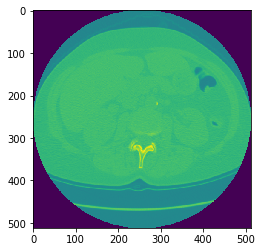

(20, 50, 50) [1 0]
528c1786cee11ffcaedbf6fff50d461a.dcm


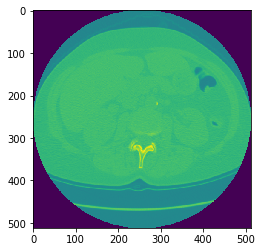

(20, 50, 50) [1 0]
586dc3e4fac85947d6b5b0c343918a55.dcm


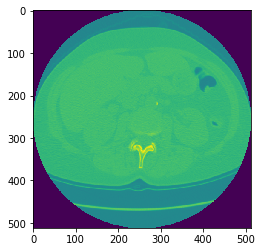

(20, 50, 50) [1 0]
5864eab592f8b5de9e8898825108bdce.dcm


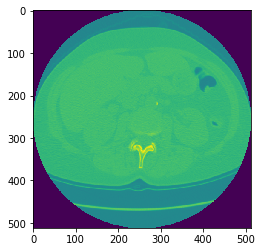

(20, 50, 50) [1 0]
604a0b0f49d08af904d9d781a5214554.dcm


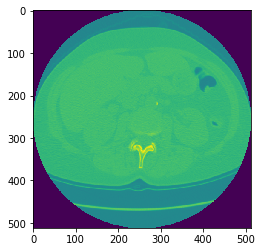

(20, 50, 50) [1 0]
0791f624c2f313bfe490ac940947977e.dcm


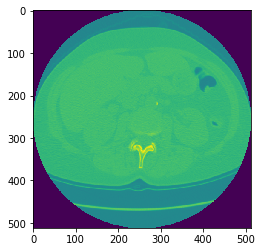

(20, 50, 50) [1 0]
703c675b0898c2013f45be3beea6cd9b.dcm


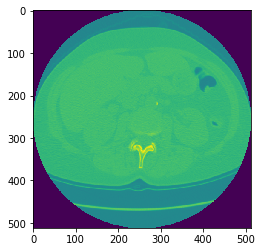

(20, 50, 50) [1 0]
0678ae61b7c56dfaf35477f6d01a6ffc.dcm


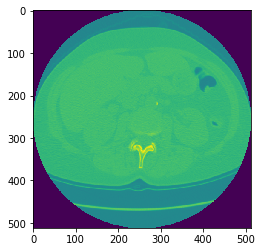

(20, 50, 50) [1 0]
3550f35f597290b97baa2650f93b791d.dcm


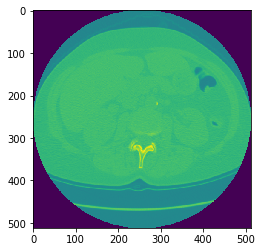

(20, 50, 50) [1 0]
706b1fd58d05f74ced760e183a4289b2.dcm


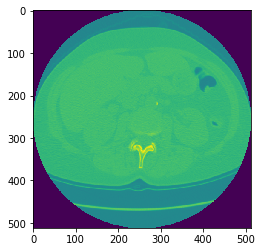

(20, 50, 50) [1 0]
995fa45fdcc074dee9a238bfa69f52b9.dcm


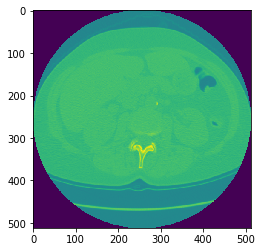

(20, 50, 50) [1 0]
936c19eea5939f5d4b237731e97ee73c.dcm


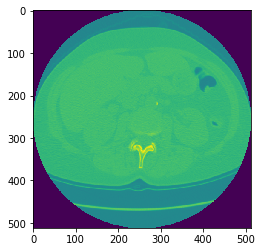

(20, 50, 50) [1 0]
7897f2a9821c4ed303bccdb313ed94b3.dcm


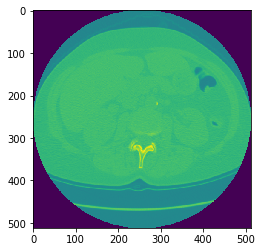

(20, 50, 50) [1 0]
16486a1cd911b9108c52f2ac512380a5.dcm


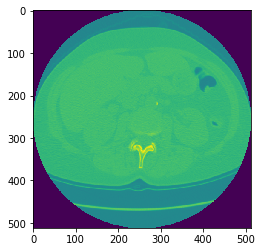

(20, 50, 50) [1 0]
24258a271e05ff73e8d1c49af05e1441.dcm


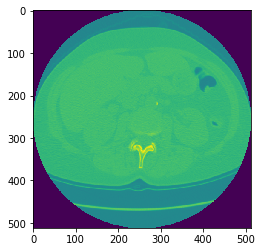

(20, 50, 50) [1 0]
27044e5a46b8135b4c031ac88aa8cf5f.dcm


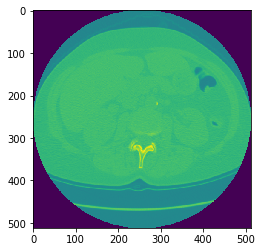

(20, 50, 50) [1 0]
67580dba709ced3854bf3dac517506de.dcm


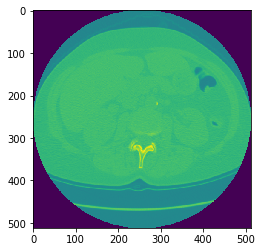

(20, 50, 50) [1 0]
090173a7ed57a872b62fd7c0b1d24be5.dcm


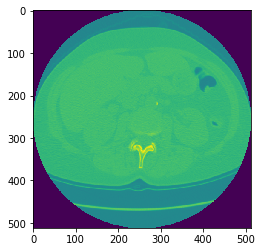

(20, 50, 50) [1 0]
415529f2bbdc20f391c9c1f8603b3b11.dcm


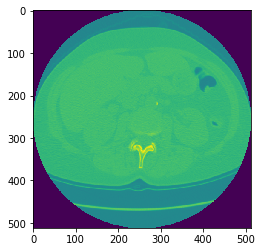

(20, 50, 50) [1 0]
233618b409b6f65cc26327d82fc773a6.dcm


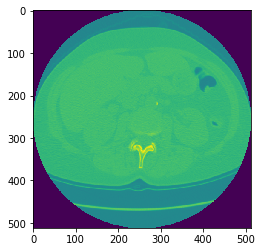

(20, 50, 50) [1 0]
230964c7e9db96fef0b540380a5a72c4.dcm


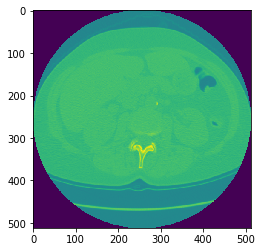

(20, 50, 50) [1 0]
211205a48984cde588c4fc77894963a9.dcm


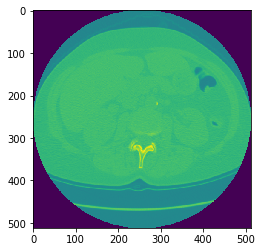

(20, 50, 50) [1 0]
7665594ce7d0ddf325f7d6b4413dd411.dcm


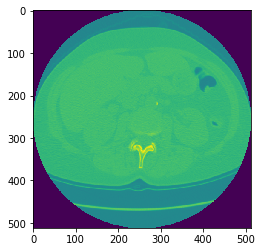

(20, 50, 50) [1 0]
80522596e3ca98563c3e1935056fb4fd.dcm


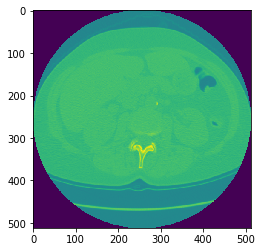

(20, 50, 50) [1 0]
8293843edee78cfc2ad682658d77bbd3.dcm


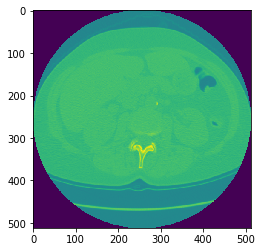

(20, 50, 50) [1 0]
42804850e0b051df2cfa0b40c6c48016.dcm


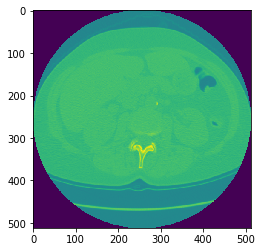

(20, 50, 50) [1 0]
695978e4c5d229945731bac2d0e18105.dcm


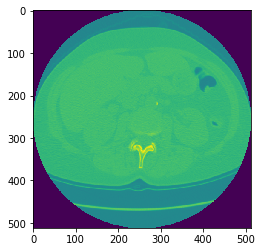

(20, 50, 50) [1 0]
835253109c3498dd66af0a0cb41530f0.dcm


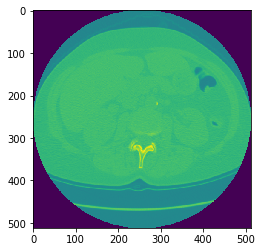

(20, 50, 50) [1 0]
706594fd92bddfb2bf80db615b28bf16.dcm


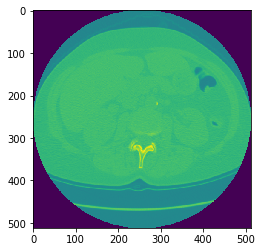

(20, 50, 50) [1 0]
1770740f7f6cb2053b462288d6855f2b.dcm


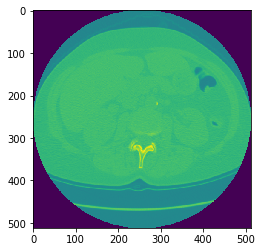

(20, 50, 50) [1 0]
6719877114f0856ddcba77d8d00c43cc.dcm


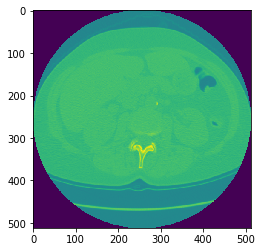

(20, 50, 50) [1 0]
1077260369ab1f39a195fc8c727f6ec6.dcm


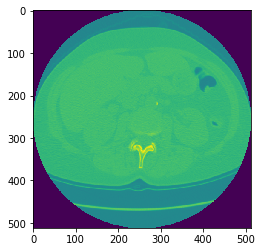

(20, 50, 50) [1 0]
a1c4a5aebd5a5a05285caaef5223e960.dcm


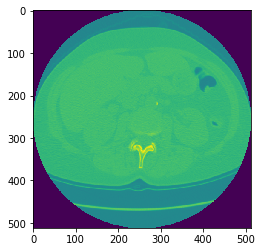

(20, 50, 50) [1 0]
abdfe3f04c706a4ecf18b1e1464d9372.dcm


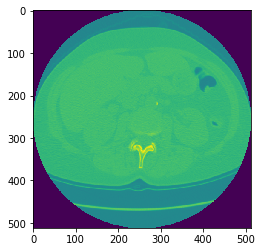

(20, 50, 50) [1 0]
a51d7b5de1b4d9fc50b2d99bdd498e2c.dcm


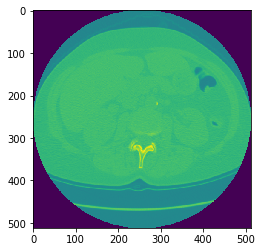

(20, 50, 50) [1 0]
ac588b16cda110f04e5f83bb30820d43.dcm


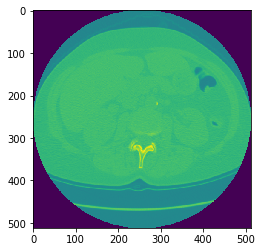

(20, 50, 50) [1 0]
a7096622ff87666124be9b65f667ac19.dcm


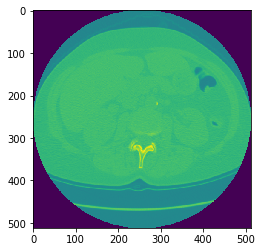

(20, 50, 50) [1 0]
ab611e5865b1a4eb3d6c5f7d24bd4f4b.dcm


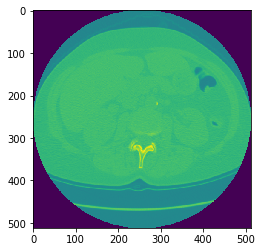

(20, 50, 50) [1 0]
ae318d30cde05384fddc4f208c981ee8.dcm


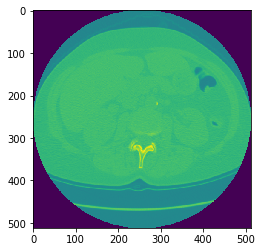

(20, 50, 50) [1 0]
ace7e133a0a9f34cd501b3108befa5a2.dcm


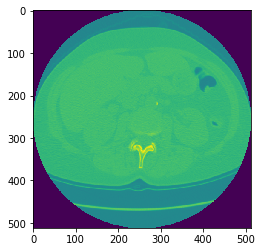

(20, 50, 50) [1 0]
acb919b2f638288f0882292468e7a448.dcm


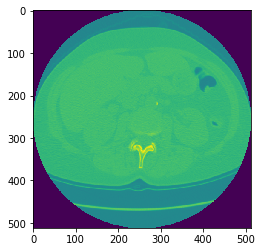

(20, 50, 50) [1 0]
ad68ddab98dfdd426756fd8772beccc0.dcm


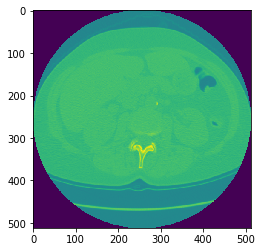

(20, 50, 50) [1 0]
b3b1706ef98df8f60c2c35d274004208.dcm


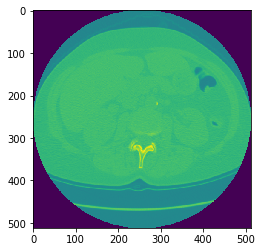

(20, 50, 50) [1 0]
b5759a0b02bada9b42d5e72fc7f7e2e1.dcm


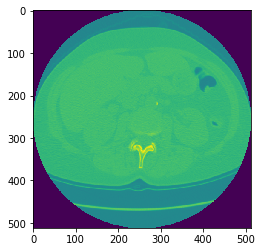

(20, 50, 50) [1 0]
b7acbc09401c3c3422e12a0d2bd3b060.dcm


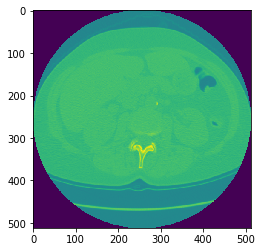

(20, 50, 50) [1 0]
b792dbfc27d50dc33e1e0f4b47401a47.dcm


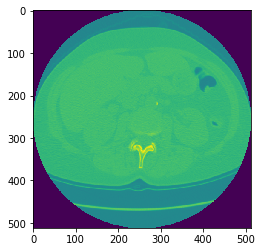

(20, 50, 50) [1 0]
baf68132894578a20ed93489aecde546.dcm


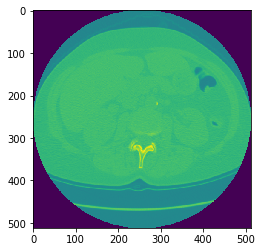

(20, 50, 50) [1 0]
bc4100f1bbaf218ac78cbeb378a5b42d.dcm


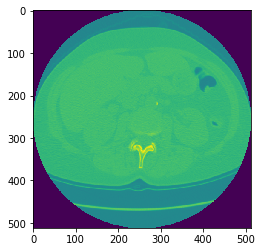

(20, 50, 50) [1 0]
bcc85297b22ac2f948fb3bb7720366a2.dcm


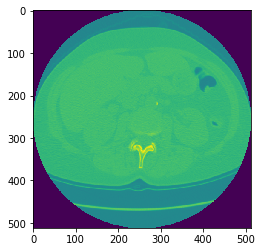

(20, 50, 50) [1 0]
bd25f42ec545affcd47bdba41a8ff7df.dcm


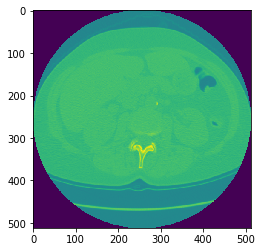

(20, 50, 50) [1 0]
50
bd2bcad572b4f3400fdfee50df02bd37.dcm


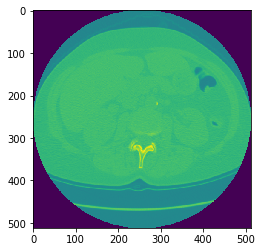

(20, 50, 50) [1 0]
034673134cbef5ea15ff9e0c8090500a.dcm


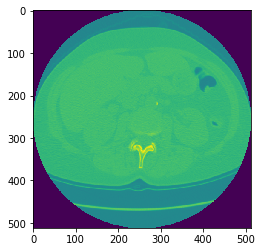

(20, 50, 50) [1 0]


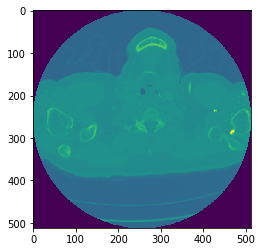

(20, 50, 50) [0 1]


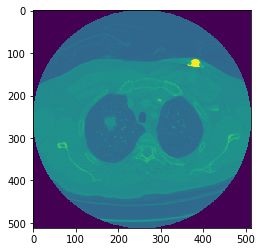

(20, 50, 50) [0 1]


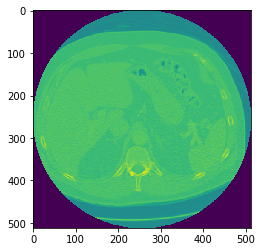

(20, 50, 50) [0 1]


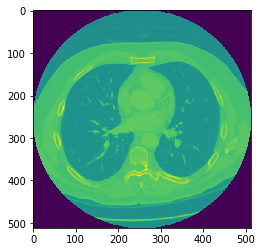

(20, 50, 50) [0 1]


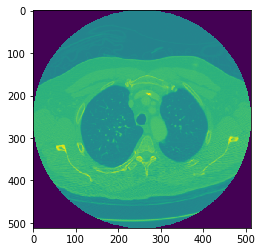

(20, 50, 50) [0 1]


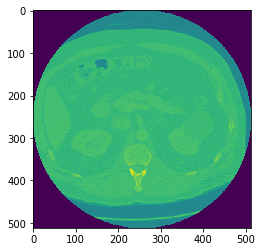

(20, 50, 50) [0 1]


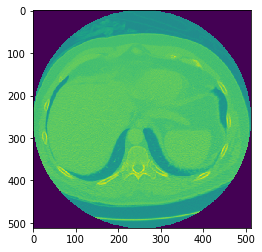

(20, 50, 50) [0 1]


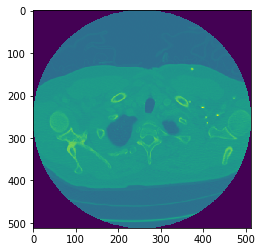

(20, 50, 50) [0 1]


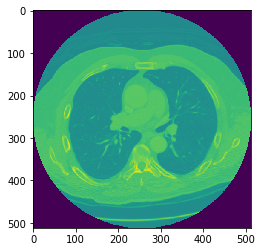

(20, 50, 50) [0 1]


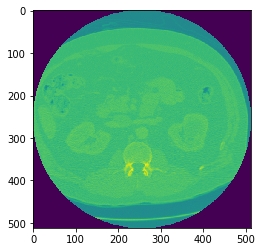

(20, 50, 50) [0 1]


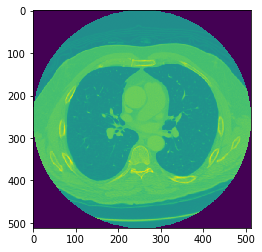

(20, 50, 50) [0 1]


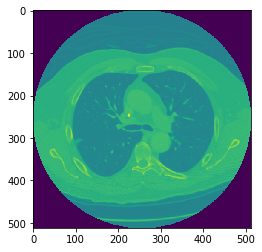

(20, 50, 50) [0 1]


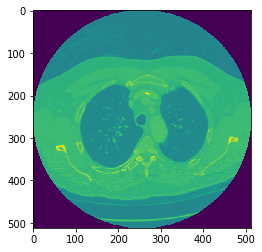

(20, 50, 50) [0 1]


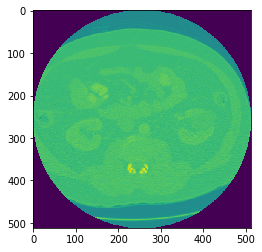

(20, 50, 50) [0 1]


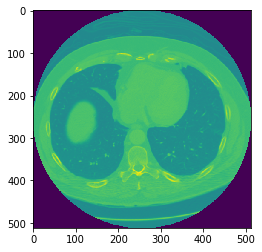

(20, 50, 50) [0 1]


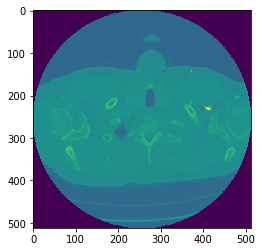

(20, 50, 50) [0 1]


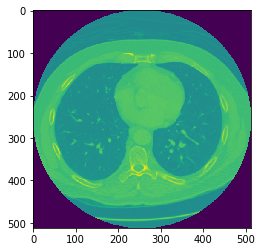

(20, 50, 50) [0 1]


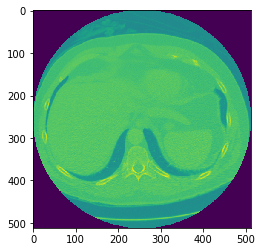

(20, 50, 50) [0 1]


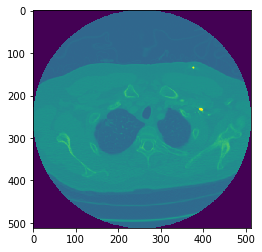

(20, 50, 50) [0 1]


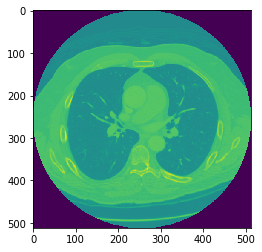

(20, 50, 50) [0 1]


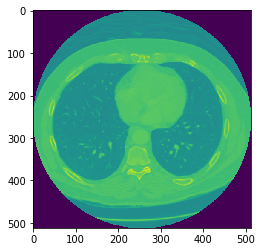

(20, 50, 50) [0 1]


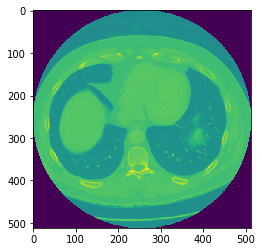

(20, 50, 50) [0 1]


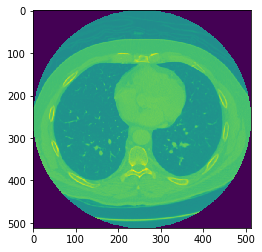

(20, 50, 50) [0 1]


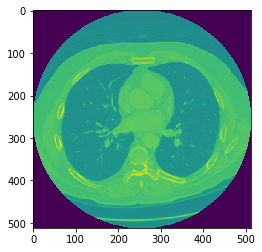

(20, 50, 50) [0 1]


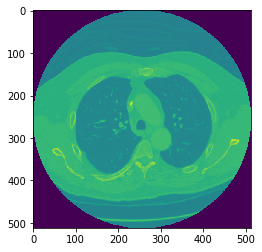

(20, 50, 50) [0 1]


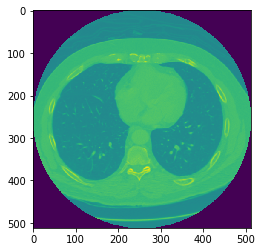

(20, 50, 50) [0 1]


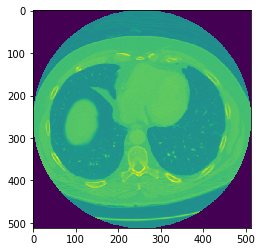

(20, 50, 50) [0 1]


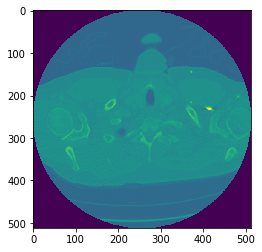

(20, 50, 50) [0 1]


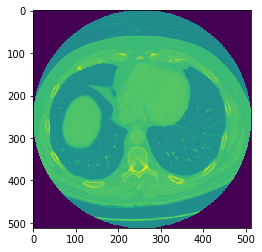

(20, 50, 50) [0 1]


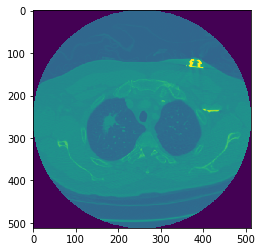

(20, 50, 50) [0 1]


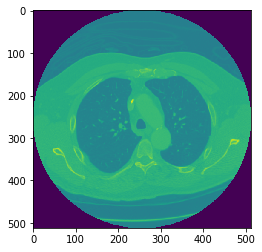

(20, 50, 50) [0 1]


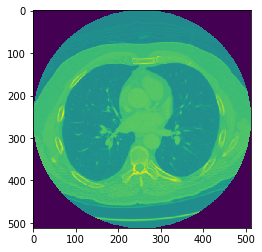

(20, 50, 50) [0 1]


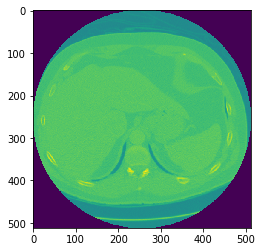

(20, 50, 50) [0 1]


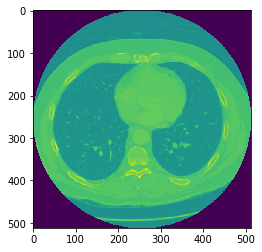

(20, 50, 50) [0 1]


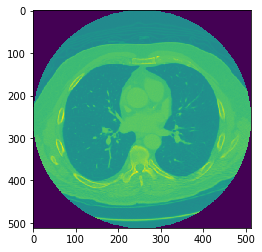

(20, 50, 50) [0 1]


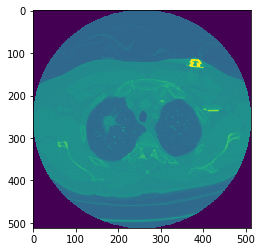

(20, 50, 50) [0 1]


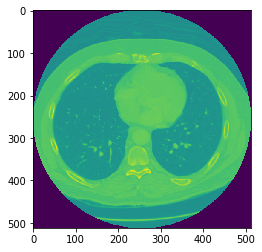

(20, 50, 50) [0 1]


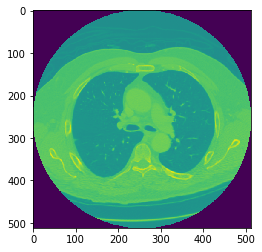

(20, 50, 50) [0 1]


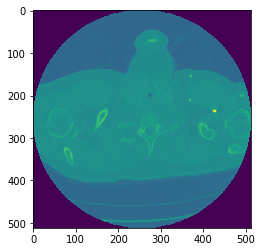

(20, 50, 50) [0 1]


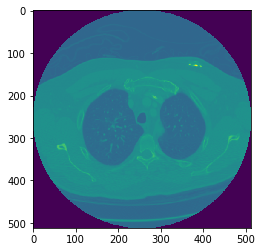

(20, 50, 50) [0 1]


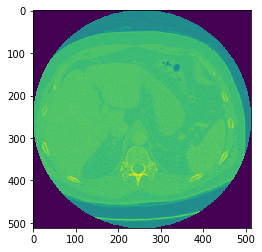

(20, 50, 50) [0 1]


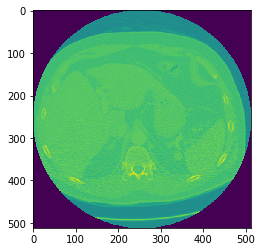

(20, 50, 50) [0 1]


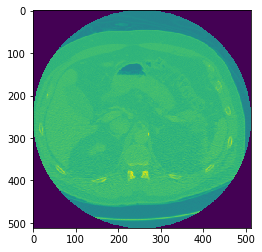

(20, 50, 50) [0 1]


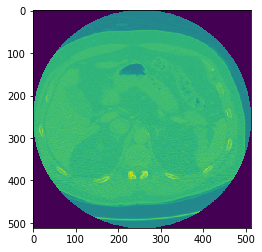

(20, 50, 50) [0 1]


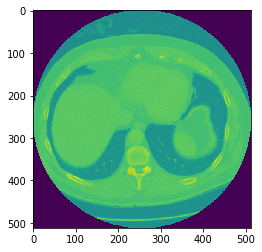

(20, 50, 50) [0 1]


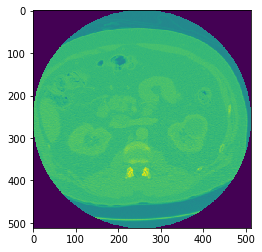

(20, 50, 50) [0 1]


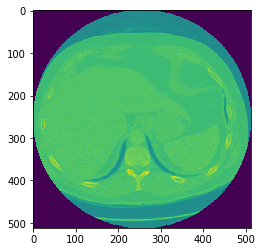

(20, 50, 50) [0 1]


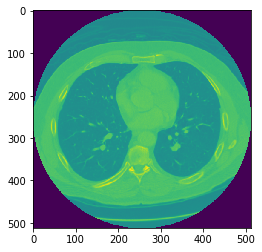

(20, 50, 50) [0 1]


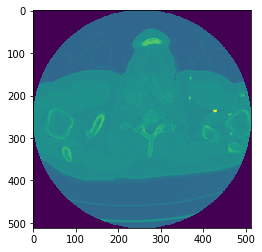

(20, 50, 50) [0 1]


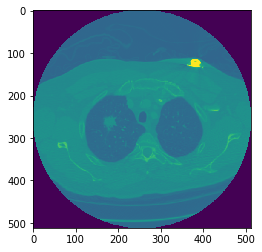

(20, 50, 50) [0 1]


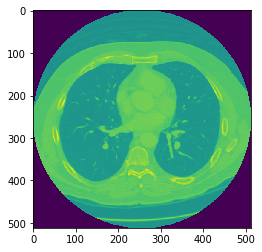

(20, 50, 50) [0 1]


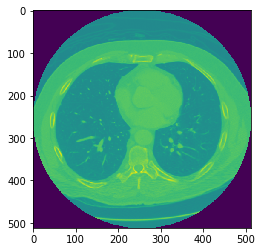

(20, 50, 50) [0 1]


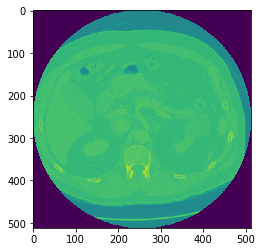

(20, 50, 50) [0 1]


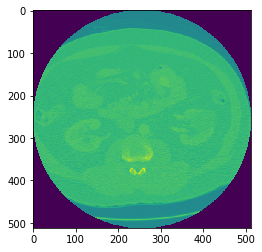

(20, 50, 50) [0 1]


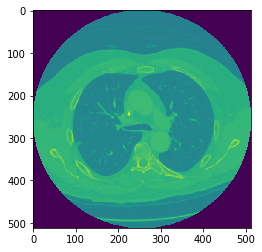

(20, 50, 50) [0 1]


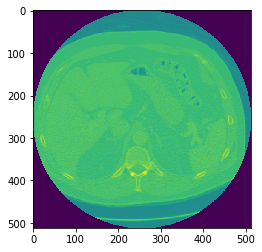

(20, 50, 50) [0 1]


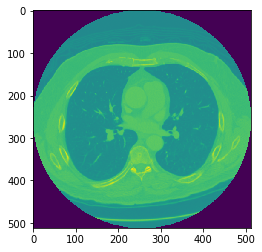

(20, 50, 50) [0 1]


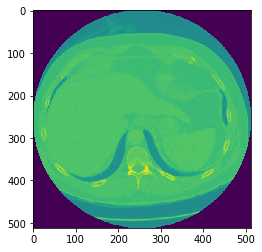

(20, 50, 50) [0 1]


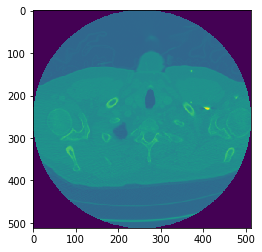

(20, 50, 50) [0 1]


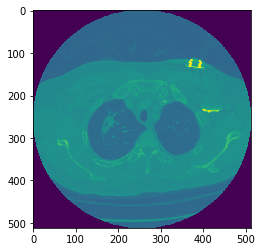

(20, 50, 50) [0 1]


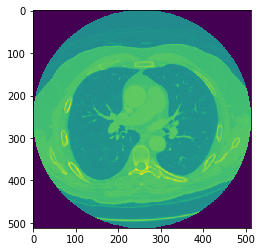

(20, 50, 50) [0 1]


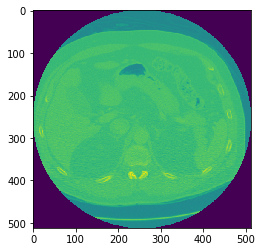

(20, 50, 50) [0 1]


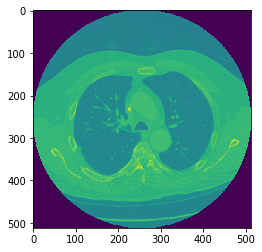

(20, 50, 50) [0 1]


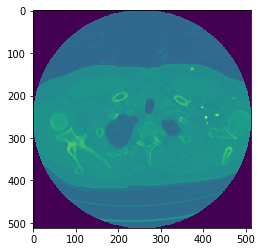

(20, 50, 50) [0 1]


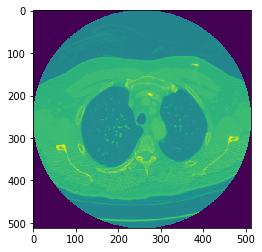

(20, 50, 50) [0 1]


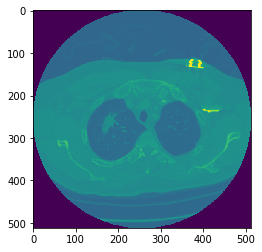

(20, 50, 50) [0 1]


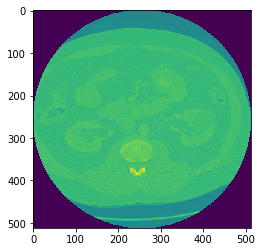

(20, 50, 50) [0 1]


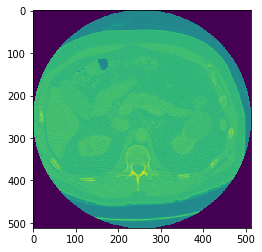

(20, 50, 50) [0 1]


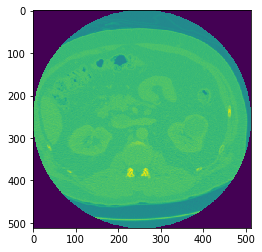

(20, 50, 50) [0 1]


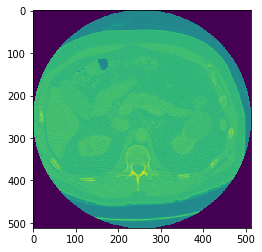

(20, 50, 50) [0 1]


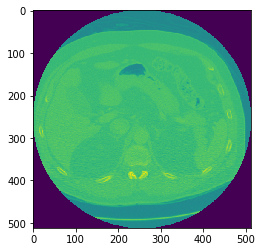

(20, 50, 50) [0 1]


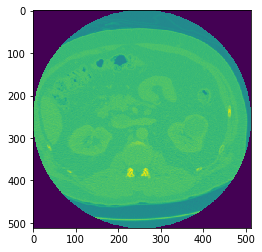

(20, 50, 50) [0 1]


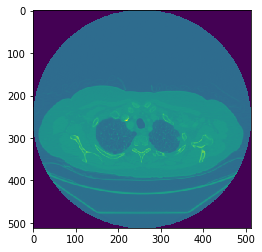

(17, 50, 50) [0 1]


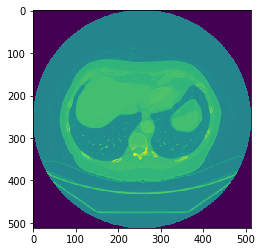

(17, 50, 50) [0 1]


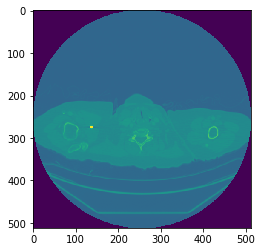

(17, 50, 50) [0 1]


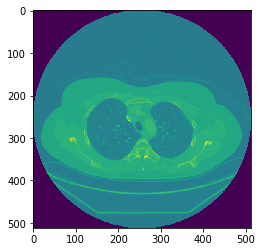

(17, 50, 50) [0 1]


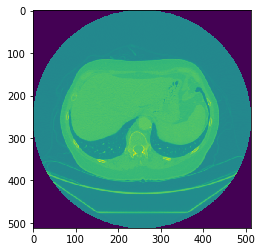

(17, 50, 50) [0 1]


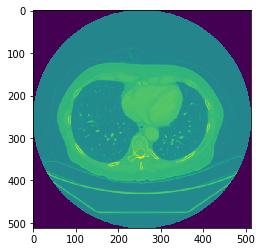

(17, 50, 50) [0 1]


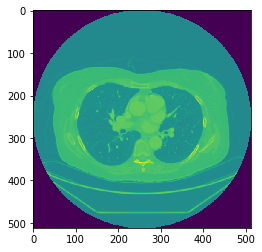

(17, 50, 50) [0 1]


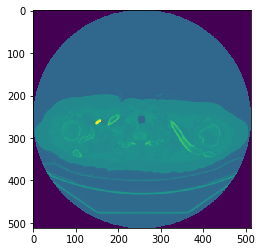

(17, 50, 50) [0 1]


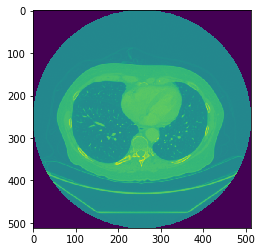

(17, 50, 50) [0 1]


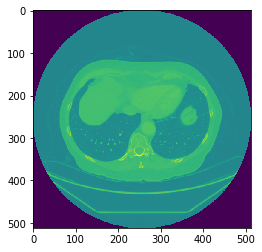

(17, 50, 50) [0 1]


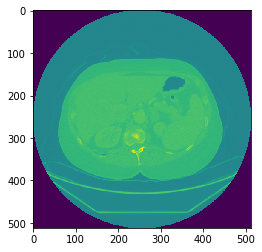

(17, 50, 50) [0 1]


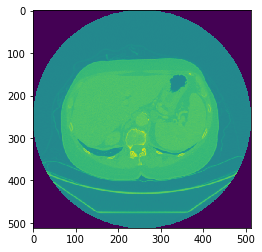

(17, 50, 50) [0 1]


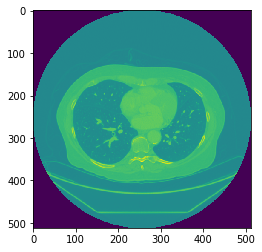

(17, 50, 50) [0 1]


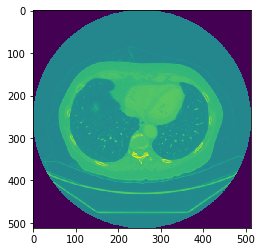

(17, 50, 50) [0 1]


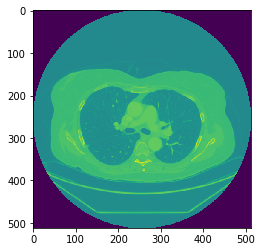

(17, 50, 50) [0 1]


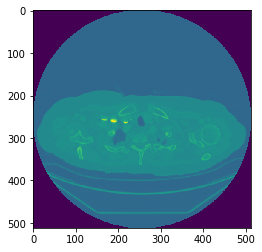

(17, 50, 50) [0 1]


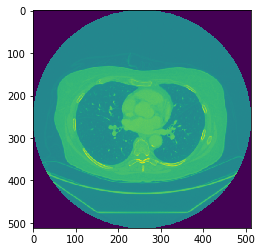

(17, 50, 50) [0 1]


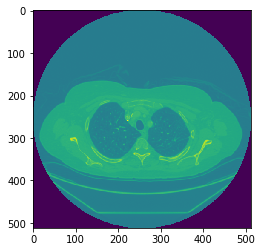

(17, 50, 50) [0 1]


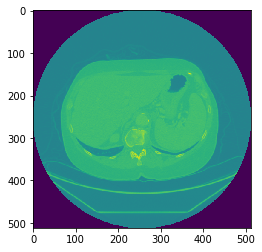

(17, 50, 50) [0 1]


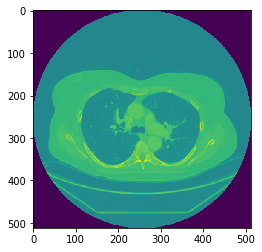

(17, 50, 50) [0 1]


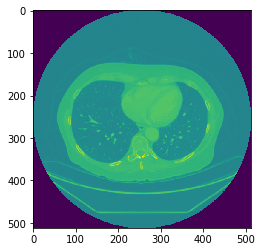

(17, 50, 50) [0 1]


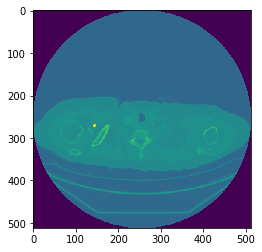

(17, 50, 50) [0 1]


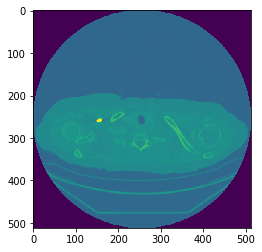

(17, 50, 50) [0 1]


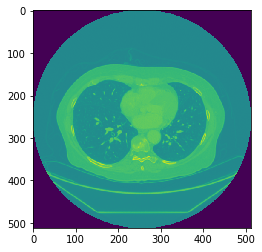

(17, 50, 50) [0 1]


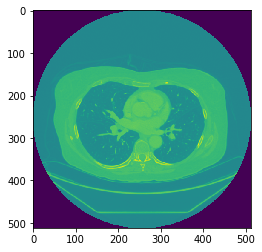

(17, 50, 50) [0 1]


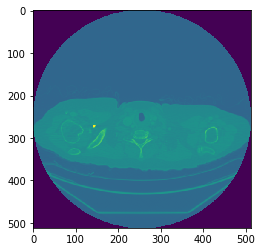

(17, 50, 50) [0 1]


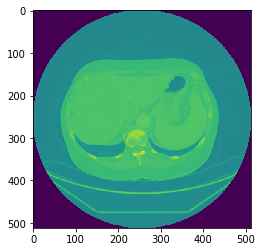

(17, 50, 50) [0 1]


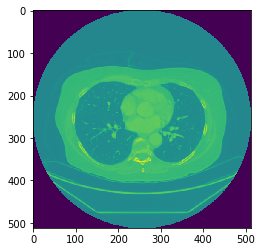

(17, 50, 50) [0 1]


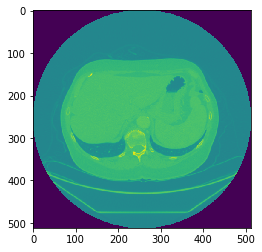

(17, 50, 50) [0 1]


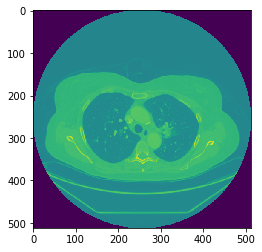

(17, 50, 50) [0 1]


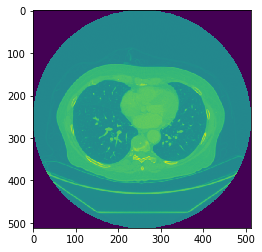

(17, 50, 50) [0 1]


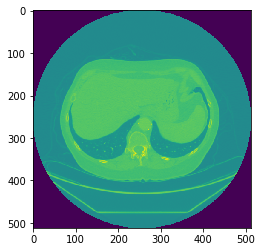

(17, 50, 50) [0 1]


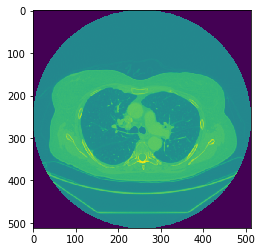

(17, 50, 50) [0 1]


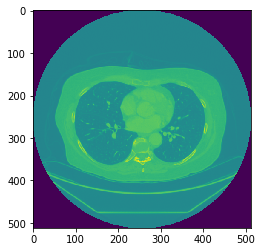

(17, 50, 50) [0 1]


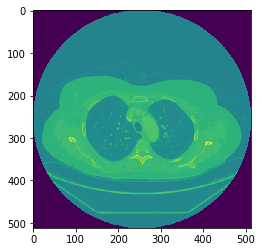

(17, 50, 50) [0 1]


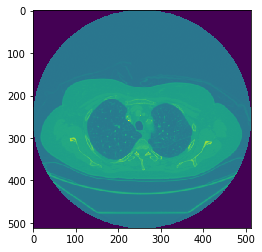

(17, 50, 50) [0 1]


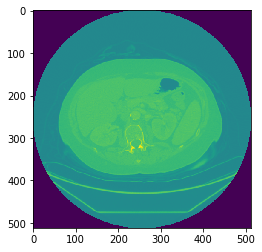

(17, 50, 50) [0 1]


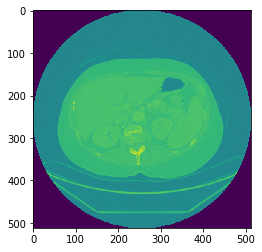

(17, 50, 50) [0 1]


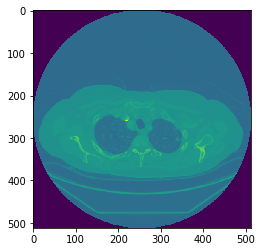

(17, 50, 50) [0 1]


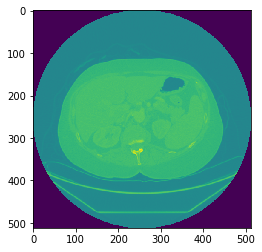

(17, 50, 50) [0 1]


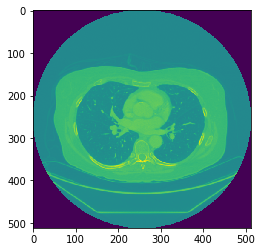

(17, 50, 50) [0 1]


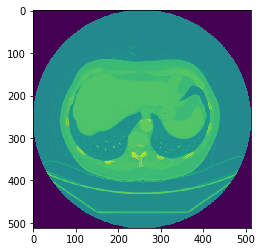

(17, 50, 50) [0 1]


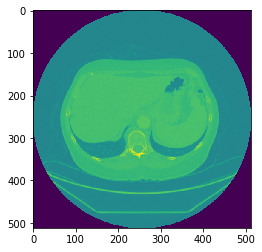

(17, 50, 50) [0 1]


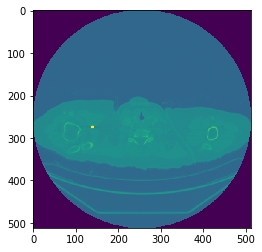

(17, 50, 50) [0 1]


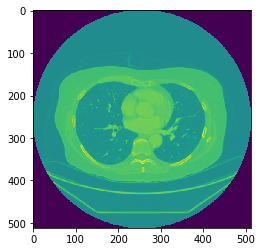

(17, 50, 50) [0 1]


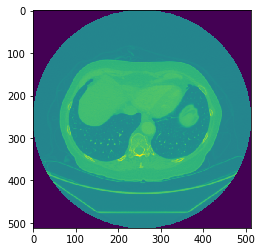

(17, 50, 50) [0 1]


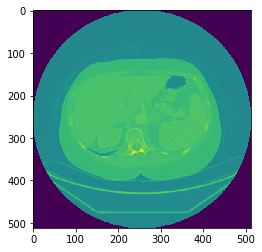

(17, 50, 50) [0 1]


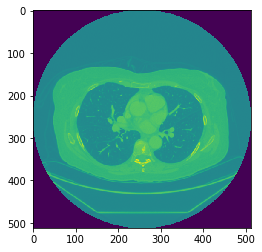

(17, 50, 50) [0 1]


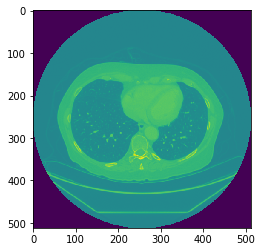

(17, 50, 50) [0 1]


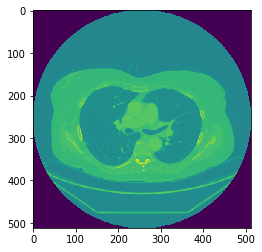

(17, 50, 50) [0 1]


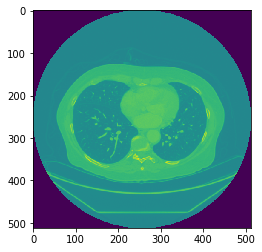

(17, 50, 50) [0 1]


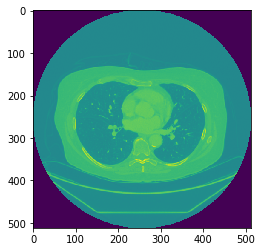

(17, 50, 50) [0 1]


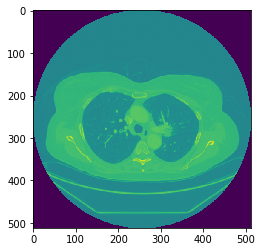

(17, 50, 50) [0 1]


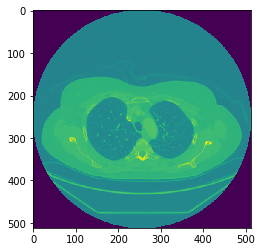

(17, 50, 50) [0 1]


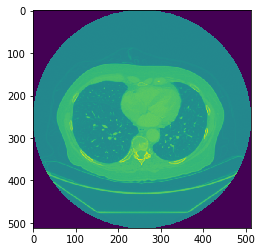

(17, 50, 50) [0 1]


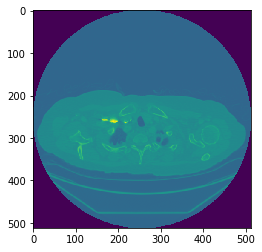

(17, 50, 50) [0 1]


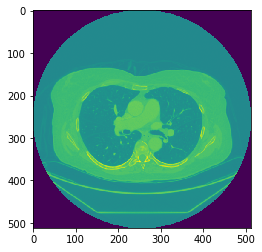

(17, 50, 50) [0 1]


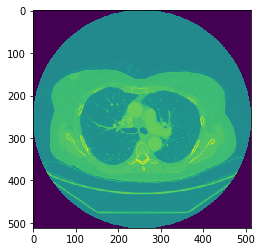

(17, 50, 50) [0 1]


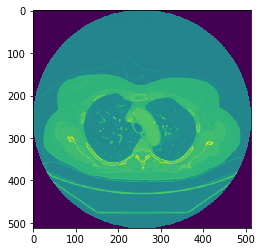

(17, 50, 50) [0 1]


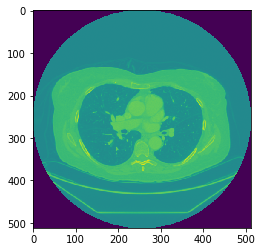

(17, 50, 50) [0 1]


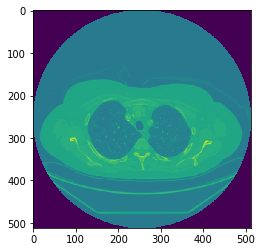

(17, 50, 50) [0 1]


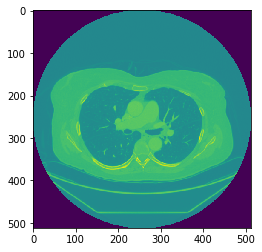

(17, 50, 50) [0 1]


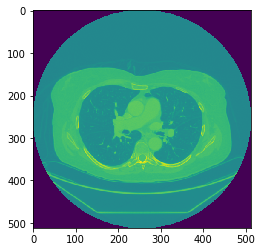

(17, 50, 50) [0 1]


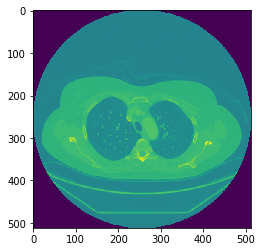

(17, 50, 50) [0 1]


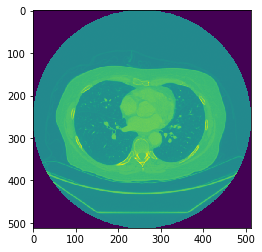

(17, 50, 50) [0 1]


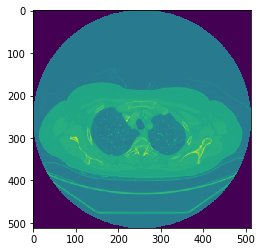

(17, 50, 50) [0 1]


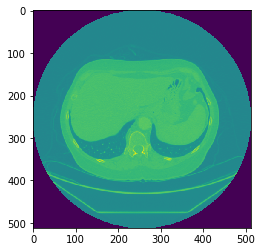

(17, 50, 50) [0 1]


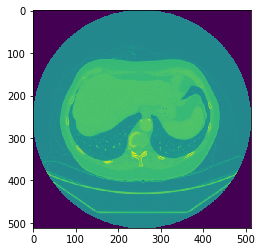

(17, 50, 50) [0 1]


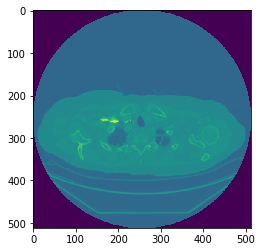

(17, 50, 50) [0 1]


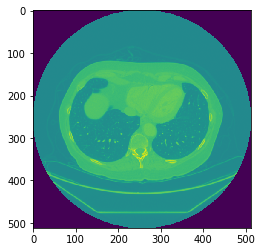

(17, 50, 50) [0 1]


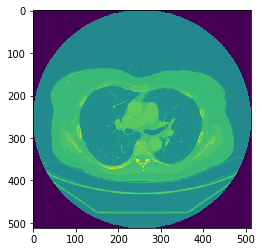

(17, 50, 50) [0 1]


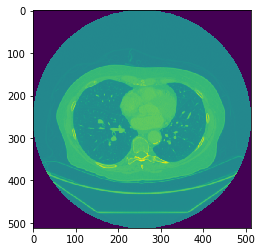

(17, 50, 50) [0 1]


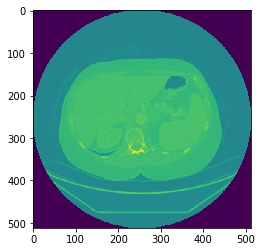

(17, 50, 50) [0 1]


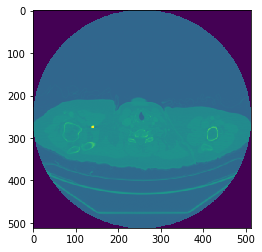

(17, 50, 50) [0 1]


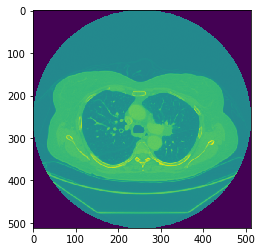

(17, 50, 50) [0 1]


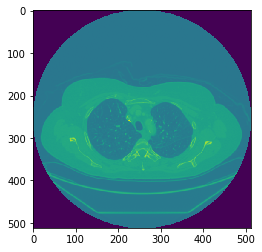

(17, 50, 50) [0 1]


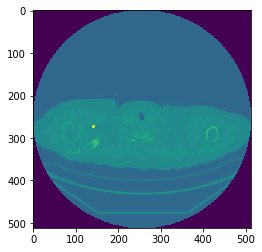

(17, 50, 50) [0 1]


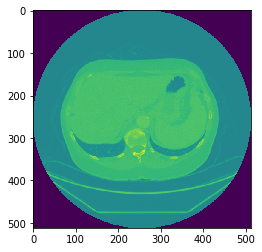

(17, 50, 50) [0 1]


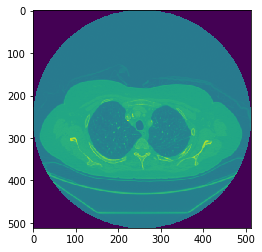

(17, 50, 50) [0 1]


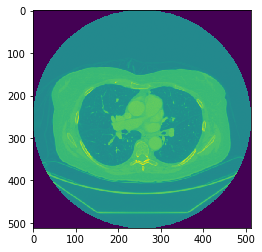

(17, 50, 50) [0 1]


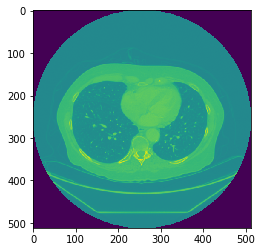

(17, 50, 50) [0 1]


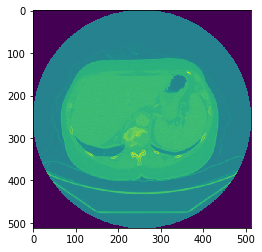

(17, 50, 50) [0 1]


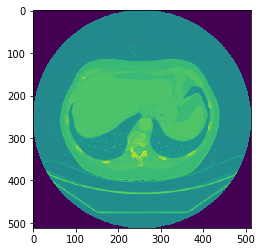

(17, 50, 50) [0 1]


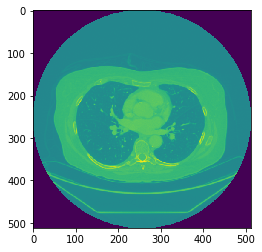

(17, 50, 50) [0 1]


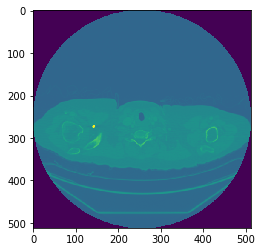

(17, 50, 50) [0 1]
Finished processing


In [ ]:
# Save processed data in a list

train_data = []
test_data = []

for num, patient in enumerate(patients):
        if num%50 == 0:
            print(num)

        try:
            
                print(patient)
                img_d , label = process_data(patient, data_labels )
                train_data.append([img_d,label])
                print(img_d.shape, label)

        except KeyError as e:
            test_data.append([img_d])
            print(img_d.shape , '\tThis is unlabeled data')
for i in range(0,1):
  for patient in X_positive[i]:
        try:
                img_d , label = process(patient, data_labels ,'positive',i)
                train_data.append([img_d,label])
                print(img_d.shape, label)

        except KeyError as e:
            test_data.append([img_d])
            print(img_d.shape , '\tThis is unlabeled data')

for i in range(1,2):
  for patient in X_positive[i]:
        try:
                img_d , label = process(patient, data_labels ,'positive',i)
                test_data.append([img_d,label])
                print(img_d.shape, label)

        except KeyError as e:
            test_data.append([img_d])
            print(img_d.shape , '\tThis is unlabeled data')

#for patient in X_negative[0]:
  #for patient in i:
 #       try:
  #              img_d , label = process(patient, data_labels ,'negative')
   #             train_data.append([img_d,label])
    #            print(img_d.shape, label)
#
 #       except KeyError as e:
  #          test_data.append([img_d])
   #         print(img_d.shape , '\tThis is unlabeled data')            
        

np.save('traindata-{}-{}-{}.npy'.format(IMG_PXL_SIZE,IMG_PXL_SIZE,HM_SLICES), train_data)
np.save('testdata-{}-{}-{}.npy'.format(IMG_PXL_SIZE,IMG_PXL_SIZE,HM_SLICES), test_data)
print('Finished processing')